<a href="https://colab.research.google.com/github/phycoding/my_first_blog/blob/main/working_with_COCO.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install fiftyone

Test split is unlabeled; ignoring classes requirement
 100% |██████|    8.7Mb/8.7Mb [384.1ms elapsed, 0s remaining, 22.7Mb/s]     
Extracting test info to '/root/fiftyone/coco-2017/raw/image_info_test2017.json'
 100% |████████████████████| 50/50 [10.6s elapsed, 0s remaining, 5.0 images/s]      
Writing annotations for 50 downloaded samples to '/root/fiftyone/coco-2017/test/labels.json'
Dataset info written to '/root/fiftyone/coco-2017/info.json'
Loading 'coco-2017' split 'test'
Dataset is unlabeled; ignoring classes requirement
 100% |███████████████████| 50/50 [50.1ms elapsed, 0s remaining, 998.4 samples/s]     
Dataset 'coco-2017-test-50' created


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


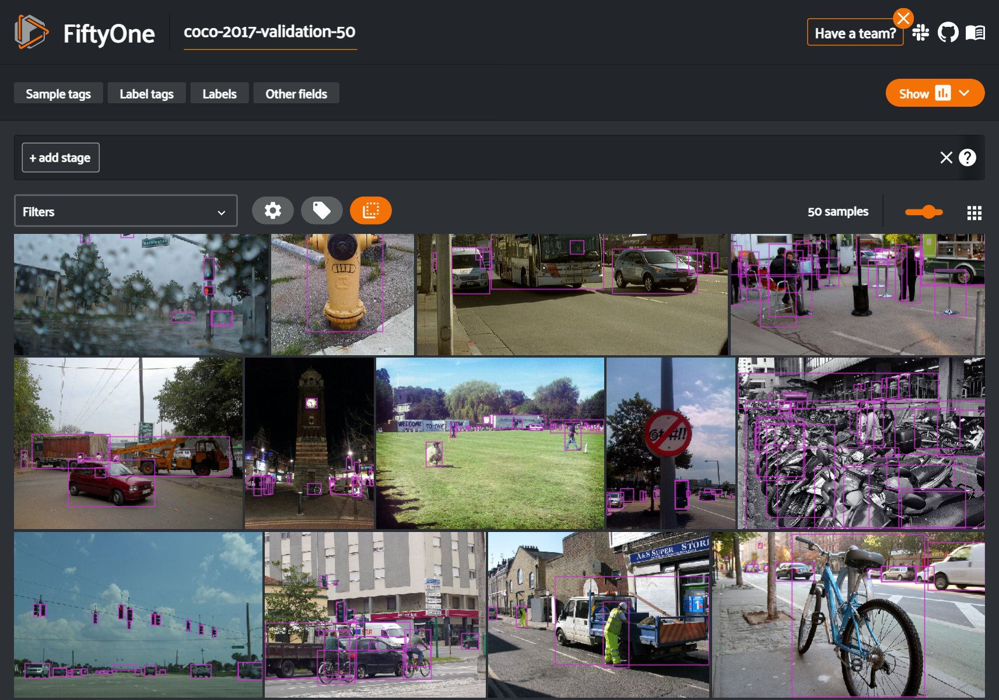

<IPython.core.display.Javascript object>

In [7]:
import fiftyone
dataset_1 = fiftyone.zoo.load_zoo_dataset(
    "coco-2017",
    split="test",
    label_types=["detections"],
    classes=["truck", "car",'person'],
    max_samples=50,
)

# Visualize the dataset in the FiftyOne App
session = fiftyone.launch_app(dataset)

In [7]:
import fiftyone.brain as fob

fob.compute_uniqueness(dataset)
rank_view = dataset.sort_by("uniqueness")

 100% |████|  100.6Mb/100.6Mb [362.6ms elapsed, 0s remaining, 277.3Mb/s]      
Generating embeddings...
 100% |███████████████████| 50/50 [1.4s elapsed, 0s remaining, 35.5 samples/s]      
Computing uniqueness...
Uniqueness computation complete


In [10]:
import torch
import torchvision
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

# Load a pre-trained Faster R-CNN model
model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=True)
model.to(device)
model.eval()

Downloading: "https://download.pytorch.org/models/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth" to /root/.cache/torch/hub/checkpoints/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth


  0%|          | 0.00/160M [00:00<?, ?B/s]

FasterRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64, eps=0.0)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64, eps=0.0)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64, eps=0.0)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256, eps=0.0)
          (relu): ReLU(

In [12]:
dataset.persistent = True
print(dataset)

Name:        coco-2017-validation-50
Media type:  image
Num samples: 50
Persistent:  True
Tags:        ['validation']
Sample fields:
    id:           fiftyone.core.fields.ObjectIdField
    filepath:     fiftyone.core.fields.StringField
    tags:         fiftyone.core.fields.ListField(fiftyone.core.fields.StringField)
    metadata:     fiftyone.core.fields.EmbeddedDocumentField(fiftyone.core.metadata.Metadata)
    ground_truth: fiftyone.core.fields.EmbeddedDocumentField(fiftyone.core.labels.Detections)


In [13]:
sample = dataset.first()
print(sample.ground_truth.detections[0])


<Detection: {
    'id': '61a22493a9843b9b0cb7539f',
    'attributes': BaseDict({}),
    'tags': BaseList([]),
    'label': 'stop sign',
    'bounding_box': BaseList([
        0.3201866666666667,
        0.14366,
        0.35864,
        0.30616000000000004,
    ]),
    'mask': None,
    'confidence': None,
    'index': None,
    'supercategory': 'outdoor',
    'iscrowd': 0,
}>


In [14]:
predictions_view = dataset.take(100, seed=51)

In [16]:
from PIL import Image
from torchvision.transforms import functional as func

import fiftyone as fo

# Get class list
classes = dataset.default_classes

# Add predictions to samples
with fo.ProgressBar() as pb:
    for sample in pb(predictions_view):
        # Load image
        image = Image.open(sample.filepath)
        image = func.to_tensor(image).to(device)
        c, h, w = image.shape

        # Perform inference
        preds = model([image])[0]
        labels = preds["labels"].cpu().detach().numpy()
        scores = preds["scores"].cpu().detach().numpy()
        boxes = preds["boxes"].cpu().detach().numpy()

        # Convert detections to FiftyOne format
        detections = []
        for label, score, box in zip(labels, scores, boxes):
            # Convert to [top-left-x, top-left-y, width, height]
            # in relative coordinates in [0, 1] x [0, 1]
            x1, y1, x2, y2 = box
            rel_box = [x1 / w, y1 / h, (x2 - x1) / w, (y2 - y1) / h]

            detections.append(
                fo.Detection(
                    label=classes[label],
                    bounding_box=rel_box,
                    confidence=score
                )
            )

        # Save predictions to dataset
        sample["faster_rcnn"] = fo.Detections(detections=detections)
        sample.save()

print("Finished adding predictions")

   0% ||------------------|  0/50 [14.4ms elapsed, ? remaining, ? samples/s] 

/usr/local/lib/python3.7/dist-packages/torch/functional.py:445: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2157.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


 100% |███████████████████| 50/50 [6.0m elapsed, 0s remaining, 0.1 samples/s]    
Finished adding predictions


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


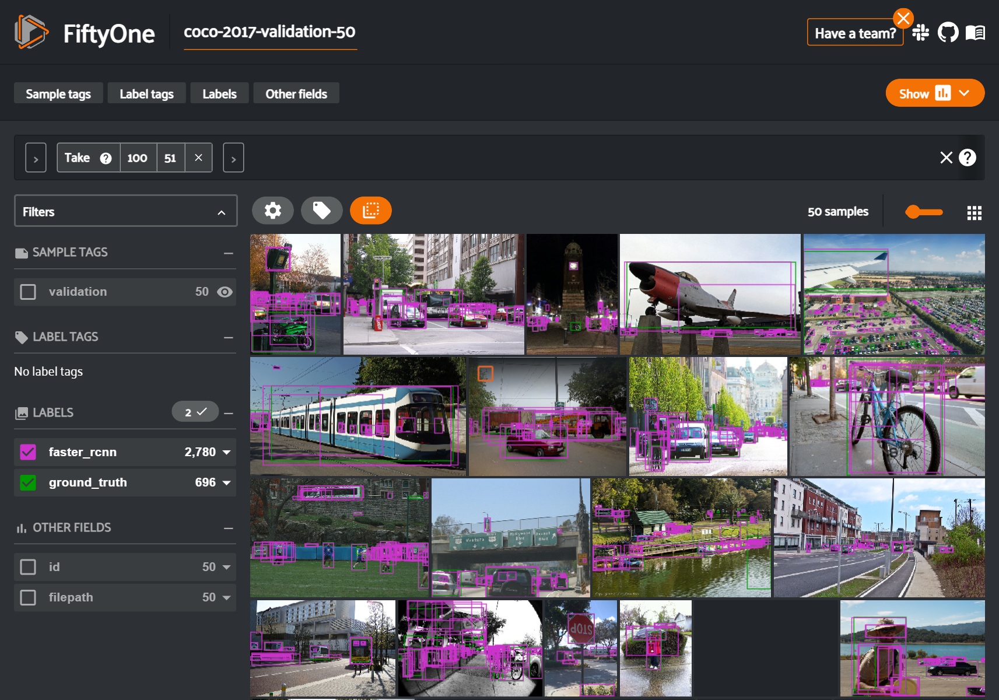

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


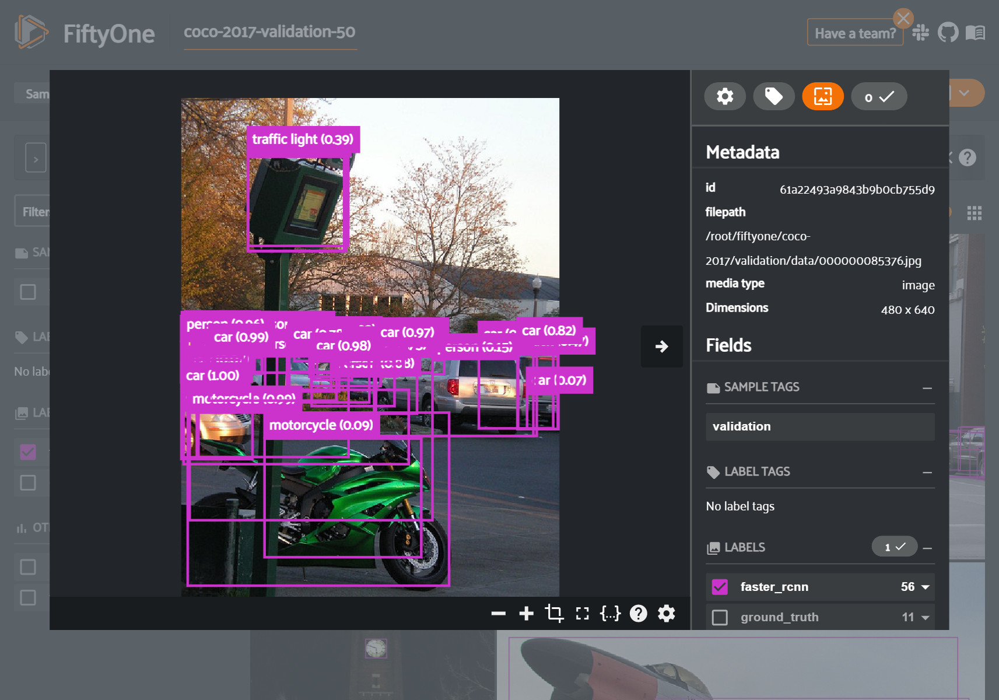

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


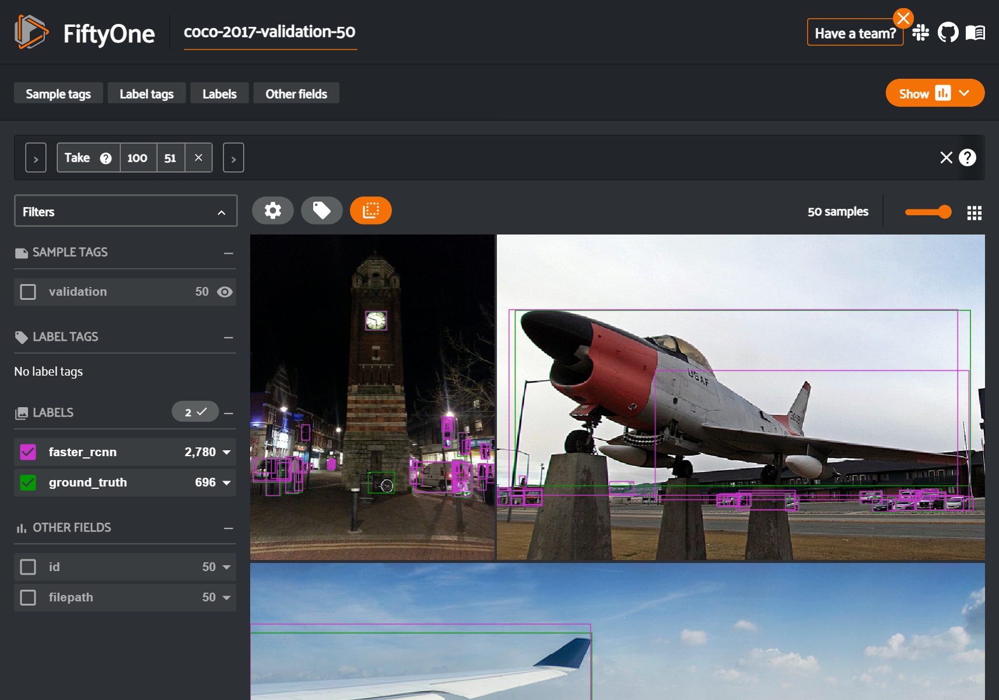

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


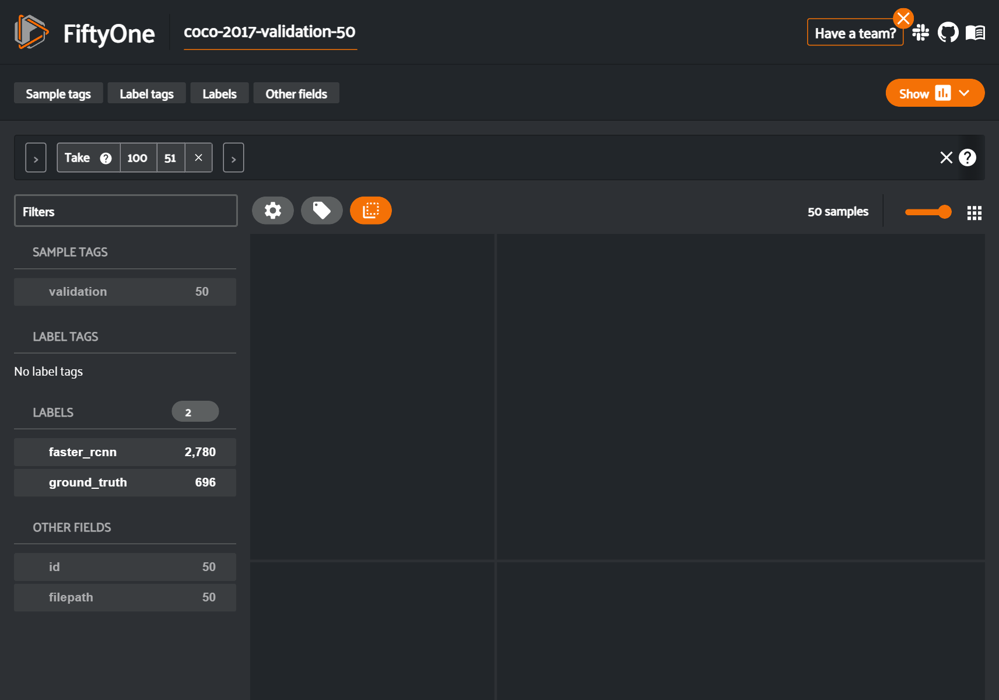

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


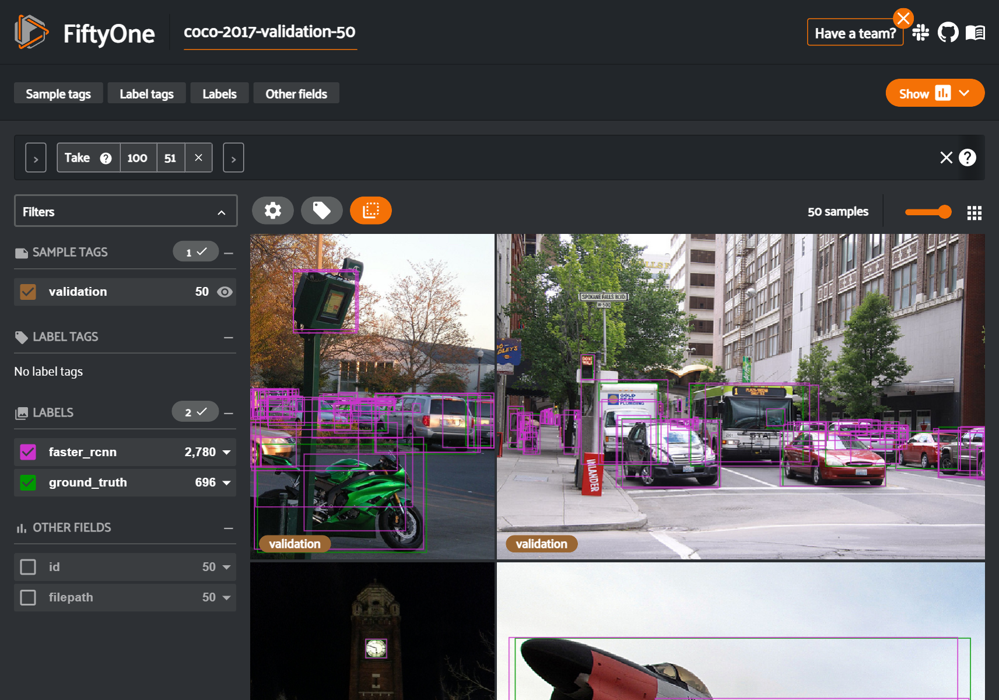

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


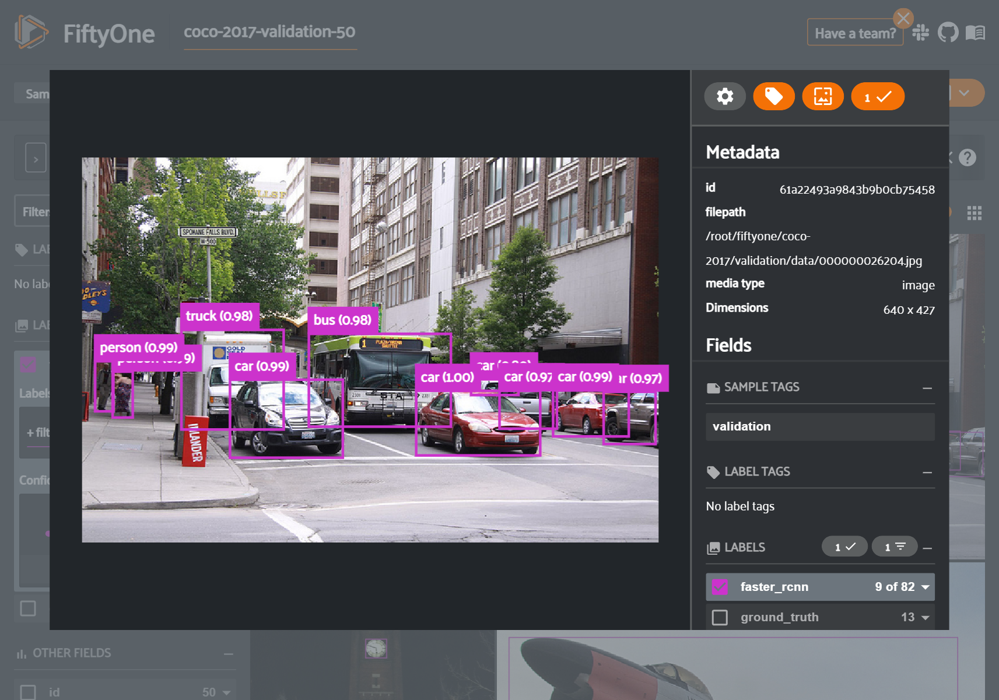

<IPython.core.display.Javascript object>

In [18]:
session.view = predictions_view
session.view = None

In [20]:
from fiftyone import ViewField as F

# Only contains detections with confidence >= 0.75
high_conf_view = predictions_view.filter_labels("faster_rcnn", F("confidence") > 0.75)
# Print some information about the view
print(high_conf_view)

Dataset:     coco-2017-validation-50
Media type:  image
Num samples: 50
Tags:        ['validation']
Sample fields:
    id:           fiftyone.core.fields.ObjectIdField
    filepath:     fiftyone.core.fields.StringField
    tags:         fiftyone.core.fields.ListField(fiftyone.core.fields.StringField)
    metadata:     fiftyone.core.fields.EmbeddedDocumentField(fiftyone.core.metadata.Metadata)
    ground_truth: fiftyone.core.fields.EmbeddedDocumentField(fiftyone.core.labels.Detections)
    faster_rcnn:  fiftyone.core.fields.EmbeddedDocumentField(fiftyone.core.labels.Detections)
View stages:
    1. Take(size=100, seed=51)
    2. FilterLabels(field='faster_rcnn', filter={'$gt': ['$$this.confidence', 0.75]}, only_matches=True, trajectories=False)


In [21]:
# Print a prediction from the view to verify that its confidence is > 0.75
sample = high_conf_view.first()
print(sample.faster_rcnn.detections[0])

<Detection: {
    'id': '61a22a63a9843b9b0cb75983',
    'attributes': BaseDict({}),
    'tags': BaseList([]),
    'label': 'car',
    'bounding_box': BaseList([
        0.00047103883698582647,
        0.5778695583343506,
        0.18798176447550455,
        0.13845009803771974,
    ]),
    'mask': None,
    'confidence': 0.9957799911499023,
    'index': None,
}>


In [22]:
# Load high confidence view in the App
session.view = high_conf_view

In [23]:
# Evaluate the predictions in the `faster_rcnn` field of our `high_conf_view`
# with respect to the objects in the `ground_truth` field
results = high_conf_view.evaluate_detections(
    "faster_rcnn",
    gt_field="ground_truth",
    eval_key="eval",
    compute_mAP=True,
)

Evaluating detections...
 100% |███████████████████| 50/50 [2.3s elapsed, 0s remaining, 21.3 samples/s]      
Performing IoU sweep...
 100% |███████████████████| 50/50 [2.3s elapsed, 0s remaining, 21.7 samples/s]      


In [24]:
# Get the 10 most common classes in the dataset
counts = dataset.count_values("ground_truth.detections.label")
classes_top10 = sorted(counts, key=counts.get, reverse=True)[:10]

# Print a classification report for the top-10 classes
results.print_report(classes=classes_top10)

               precision    recall  f1-score   support

          car       0.76      0.64      0.69       224
       person       0.79      0.68      0.73       201
        truck       0.69      0.29      0.41        82
traffic light       0.74      0.65      0.69        43
   motorcycle       0.83      0.38      0.53        26
        chair       0.44      0.21      0.29        19
         boat       0.91      0.62      0.74        16
      bicycle       0.88      0.47      0.61        15
 dining table       0.00      0.00      0.00        14
          bus       0.83      0.77      0.80        13

    micro avg       0.76      0.57      0.65       653
    macro avg       0.69      0.47      0.55       653
 weighted avg       0.74      0.57      0.64       653



In [25]:
plot = results.plot_pr_curves(classes=["person", "car"])
plot.show()